In [79]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [1]:
%pip install plotly==5.11.0
#%conda install matplotlib

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
Note: you may need to restart the kernel to use updated packages.


In [1]:
# reqruied libraries
import pandas as pd
import numpy as np
import datetime
import glob
import os
import time
from scipy import stats
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from bumpplot import bumpchart

In [2]:
# s3 specific libraries
import s3fs
import boto3
s3 = s3fs.S3FileSystem(anon=False)

In [3]:
# column name relations
cmap = {'UF':'tomato','UM':'lawngreen','TF':'cornflowerblue','TM':'fuchsia'}
classes=['UF', 'UM', 'TF', 'TM']
all_cols = []
src_cols = {}
for s in classes:
    src_cols[s] = []
    for t in classes:
        col_name = f"{s}_{t}"
        all_cols.append(col_name)
        src_cols[s].append(col_name)
        
print('all cols',all_cols)
print('src cols',src_cols)

all cols ['UF_UF', 'UF_UM', 'UF_TF', 'UF_TM', 'UM_UF', 'UM_UM', 'UM_TF', 'UM_TM', 'TF_UF', 'TF_UM', 'TF_TF', 'TF_TM', 'TM_UF', 'TM_UM', 'TM_TF', 'TM_TM']
src cols {'UF': ['UF_UF', 'UF_UM', 'UF_TF', 'UF_TM'], 'UM': ['UM_UF', 'UM_UM', 'UM_TF', 'UM_TM'], 'TF': ['TF_UF', 'TF_UM', 'TF_TF', 'TF_TM'], 'TM': ['TM_UF', 'TM_UM', 'TM_TF', 'TM_TM']}


In [4]:
actorsdf = pd.read_csv('./OUTPUT/actors.csv', dtype={'actor_id':str,'actor_label':str})
actorsdf

,actor_id,actor_label,actor_type,num_users
0,0,twitter.com,plat,415290
1,1,NaN,indv,1
2,2,RT_com,indv,1
3,3,CraigMurrayOrg,indv,1
4,4,Billbrowder,indv,1
...,...,...,...,...
107,107,6,comm,8066
108,108,7,comm,5650
109,109,8,comm,4576
110,110,9,comm,3888


In [5]:
indv_actors_set = set(actorsdf[(actorsdf['actor_type'] == 'indv') & (actorsdf['actor_label'].notnull())]['actor_id'])

## Influence Cascade over time

In [6]:
def calculate_te_levels_df(in_roots, in_all_nodes, in_edges_df):
    # iterate over levels
    this_level_nodes = in_roots
    visited = set()
    te_values = []
    this_level = 0
    while len(visited) < len(in_all_nodes):
        # mark this level as visited
        print(f" nodes in this level : {this_level_nodes}")
        if len(this_level_nodes) <= 0:
            print(f"visited {len(visited)} of {len(in_all_nodes)}")
            break
        visited.update(this_level_nodes)
        this_level += 1
        # process this level
        edges_from_this_level = in_edges_df[in_edges_df['Source'].isin(this_level_nodes)]
        sum_te_this_level = edges_from_this_level[all_cols].sum()
        sum_te_this_level = sum_te_this_level #/ sum_te_this_level.sum() # normalize
        te_values.append( sum_te_this_level )
        # calc nodes on next level
        this_level_nodes = set(edges_from_this_level['Target'].to_list()).difference(visited)

    total_levels = this_level
    print(f"Total levels: {total_levels}")
    if len(te_values) == 0:
        print("No data for this roots!")
        return total_levels, None
    te_levels_df = pd.concat(te_values, axis=1)
    #print(te_levels_df)
    return total_levels, te_levels_df

#total_levels, te_levels_df = calculate_te_levels_df(roots, all_nodes, edges_df)
#print('total_levels:', total_levels)
#print('te levels df: \n', te_levels_df)

def draw_influence_cascade_graph(in_total_levels, in_te_levels_df, in_label):
    all_labels = []
    label_color = []
    label_index = {}
    next_index = 0

    src = []
    tgt = []
    val = []

    def get_label_index(this_label):
        nonlocal label_index
        nonlocal next_index
        if this_label not in label_index:
            all_labels.append(this_label)
            label_color.append(cmap[this_label[:2]])
            label_index[this_label] = next_index
            next_index += 1
        return label_index[this_label]

    for this_level in range(in_total_levels):
        for this_src_class in all_cols:
            this_src_label = f"{this_src_class[:2]}_{this_level}"
            this_tgt_label = f"{this_src_class[3:]}_{this_level + 1}"
            #print(this_src_label, this_tgt_label, in_te_levels_df.loc[this_src_class, this_level], cmap[this_src_label[:2]])
            this_src_label_index = get_label_index(this_src_label)
            this_tgt_label_index = get_label_index(this_tgt_label)
            src.append(this_src_label_index)
            tgt.append(this_tgt_label_index)
            val.append(in_te_levels_df.loc[this_src_class, this_level])

    fig = go.Figure(data=[go.Sankey(
        node = dict(
            pad = 15,
            thickness = 20,
            line = dict(color = "black", width = 0.5),
            label = all_labels,
            color = label_color
        ),
        link = dict(
            source = src,
            target = tgt,
            value = val,
            color= [label_color[x] for x in src]
      ))])

    fig.update_layout(title_text=f"Influence Cascade {in_label}", font_size=10)
    fig.show()

#draw_influence_cascade_graph(total_levels, te_levels_df)

def draw_influence_cascade(in_te_threshold, in_edges_df, in_label, in_roots=None, in_add_roots=False):
    # simplify graph by filtering edges using a TE threshold value
    filtered_edges_df = in_edges_df[in_edges_df['total_te'] > in_te_threshold]
    # get all nodes in the simplified graph
    src_nodes = set(list(filtered_edges_df['Source'].unique()))
    tgt_nodes = set(list(filtered_edges_df['Target'].unique()))
    all_nodes = src_nodes.union(tgt_nodes)
    #node_indegree = { n:0 for n in all_nodes }
    #node_indegree = filtered_edges_df['Target'].value_counts()
    #print(node_indegree)
    #print(f'num_nodes: {len(all_nodes)}')
    if in_roots is None:
        # nodes with 0 in_degree
        roots = all_nodes.difference(tgt_nodes)
    else:
        roots = in_roots
        if in_add_roots:
            roots = in_roots.union(all_nodes.difference(tgt_nodes))
    print('roots:',roots)
    if len(roots) > 0:
        total_levels, te_levels_df = calculate_te_levels_df(roots, all_nodes, filtered_edges_df)
        #print('total_levels:', total_levels)
        #print('te levels df: \n', te_levels_df)
        if te_levels_df is not None:
            draw_influence_cascade_graph(total_levels, te_levels_df, f"{in_label} (TE > {in_te_threshold})")
        return True, all_nodes
    else:
        print(f"No roots for TE > {in_te_threshold}")
        return False, all_nodes

In [7]:
data_folder = './OUTPUT/'

In [8]:
edges_df = pd.read_csv("./OUTPUT/dynamic/growing/actor_te_edges_2018_03_01_2018_03_07.csv", dtype={"Source":str, "Target":str})
print(edges_df)
r1 = draw_influence_cascade(0.3, edges_df, "rootLevel")

      Source Target  UF_UF     UF_UM  UF_TF     UF_TM     UM_UF     UM_UM  \
0          0      1    0.0  0.000000    0.0  0.000000  0.000000  0.000000   
1          0      2    0.0  0.333333    0.0  0.000000  0.000000  0.000000   
2          0      3    0.0  0.000000    0.0  0.000000  0.601607  0.000000   
3          0      4    0.0  0.000000    0.0  0.333333  0.000000  0.000000   
4          0      5    0.0  0.000000    0.0  0.000000  0.000000  0.601607   
...      ...    ...    ...       ...    ...       ...       ...       ...   
12427    111    106    0.0  0.000000    0.0  0.000000  0.000000  0.333333   
12428    111    107    0.0  0.000000    0.0  0.000000  0.000000  0.333333   
12429    111    108    0.0  0.000000    0.0  0.000000  0.000000  0.333333   
12430    111    109    0.0  0.000000    0.0  0.000000  0.000000  0.060755   
12431    111    110    0.0  0.000000    0.0  0.000000  0.000000  0.333333   

          UM_TF     UM_TM     TF_UF     TF_UM  TF_TF  TF_TM     TM_UF  \
0 

In [9]:
dynamic_files_list = glob.glob(data_folder + '/dynamic/growing/actor_te_edges_*.csv')
dynamic_files_list.sort()
#roots = {'32', '2', '59', '55', '35', '8', '38', '18', '56', '13', '44', '9'}
#{'38', '44', '107', '8', '0', '35', '102', '113', '103', '4', '56', '55', '32', '91', '59', '110', '18', '114', '112', '106', '26', '105', '104', '108', '101', '9', '111', '92', '109', '2', '13'}
roots = {'14'}
for idx, dfile in enumerate(dynamic_files_list):
    if idx % 4 != 2:
        continue
    s1 = os.path.basename(dfile)[15:-4]
    edges_df = pd.read_csv(dfile, dtype={"Source":str, "Target":str})
    #print(edges_df)
    for threshold in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]:
        r = draw_influence_cascade(threshold, edges_df, f"[{s1[:10]} --- {s1[11:]}] by Total TE", roots, False)
        if r[0]:
            break # break at first threshold that works to find roots (in case we are searching for roots at each iteration)


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'19', '15', '63', '61', '57', '11', '18', '100', '70', '21', '101', '53', '111', '0', '47', '4', '7', '48', '102', '3', '108', '5', '34', '29', '33', '27', '55', '59', '32', '2', '71', '105', '17', '51', '28', '106', '37', '104', '62', '110', '49', '41', '8', '87', '103', '10', '109', '107'}
 nodes in this level : {'96', '75'}
Total levels: 3


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'19', '15', '84', '22', '61', '63', '35', '11', '18', '100', '96', '70', '21', '101', '53', '45', '111', '90', '0', '4', '7', '48', '102', '3', '6', '107', '5', '108', '34', '29', '27', '33', '55', '2', '32', '38', '71', '105', '12', '17', '51', '85', '28', '106', '37', '104', '62', '110', '49', '41', '103', '10', '109', '74', '72', '30'}
 nodes in this level : {'43', '64', '57', '23', '82', '86', '47', '50', '99', '42', '59', '16', '26', '97', '75', '31', '46', '8', '87', '24'}
Total levels: 3


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'61', '18', '23', '100', '70', '21', '101', '53', '111', '90', '47', '7', '102', '3', '6', '42', '29', '33', '32', '2', '52', '94', '77', '38', '71', '105', '30', '12', '17', '80', '85', '28', '36', '39', '110', '44', '41', '8', '64', '84', '63', '35', '11', '68', '96', '93', '86', '0', '83', '4', '48', '79', '108', '5', '73', '34', '27', '55', '59', '51', '92', '75', '106', '37', '104', '62', '46', '49', '103', '109', '60', '72', '107'}
 nodes in this level : {'43', '19', '15', '22', '57', '82', '45', '50', '95', '99', '69', '16', '20', '26', '66', '97', '31', '87', '24', '10', '74'}
Total levels: 3


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'61', '18', '23', '100', '70', '21', '101', '53', '111', '90', '7', '102', '3', '29', '33', '32', '77', '38', '71', '105', '30', '26', '12', '17', '80', '85', '28', '36', '39', '110', '44', '41', '8', '64', '84', '63', '35', '11', '68', '96', '93', '86', '0', '83', '48', '108', '79', '5', '73', '34', '27', '55', '59', '51', '75', '106', '104', '62', '46', '49', '103', '109', '72', '107'}
 nodes in this level : {'43', '19', '15', '22', '57', '88', '78', '82', '60', '81', '76', '45', '91', '47', '50', '4', '95', '99', '6', '69', '42', '94', '52', '2', '58', '16', '20', '92', '97', '66', '31', '37', '87', '24', '10', '74'}
Total levels: 3


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'64', '84', '63', '61', '88', '35', '11', '18', '23', '68', '96', '100', '21', '101', '86', '53', '111', '90', '0', '48', '107', '108', '102', '6', '5', '29', '33', '27', '32', '38', '71', '105', '26', '12', '17', '51', '97', '75', '85', '28', '106', '104', '62', '110', '44', '46', '8', '103', '109', '72', '30'}
 nodes in this level : {'43', '13', '19', '15', '22', '57', '78', '82', '70', '60', '76', '81', '93', '45', '91', '47', '83', '4', '50', '79', '7', '3', '95', '69', '99', '42', '34', '73', '59', '55', '94', '52', '2', '58', '77', '16', '20', '80', '92', '66', '65', '31', '37', '39', '36', '49', '41', '87', '24', '10', '74'}
Total levels: 3


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'64', '84', '63', '61', '88', '35', '11', '18', '23', '68', '96', '100', '21', '101', '86', '53', '111', '90', '0', '48', '108', '102', '6', '5', '29', '33', '27', '32', '94', '38', '71', '105', '12', '17', '51', '97', '75', '85', '28', '106', '104', '62', '110', '44', '8', '103', '109', '72', '107'}
 nodes in this level : {'43', '13', '19', '15', '22', '57', '78', '82', '70', '60', '56', '81', '76', '93', '45', '91', '47', '83', '4', '50', '79', '7', '3', '95', '69', '99', '42', '34', '73', '59', '55', '52', '2', '58', '77', '16', '20', '26', '80', '92', '66', '65', '31', '37', '39', '36', '9', '46', '49', '41', '87', '24', '10', '74', '30'}
Total levels: 3


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'84', '63', '61', '88', '35', '11', '23', '68', '100', '21', '53', '111', '90', '0', '48', '108', '102', '5', '29', '27', '32', '38', '71', '105', '12', '17', '97', '75', '85', '28', '106', '104', '62', '44', '49', '8', '103', '109', '107'}
 nodes in this level : {'43', '13', '64', '19', '15', '22', '57', '18', '78', '82', '70', '101', '56', '60', '76', '81', '96', '86', '93', '45', '91', '47', '83', '4', '50', '79', '7', '6', '3', '69', '95', '99', '42', '34', '73', '33', '59', '55', '94', '52', '2', '58', '77', '16', '20', '26', '80', '51', '92', '66', '65', '31', '37', '39', '36', '110', '9', '46', '41', '87', '24', '10', '74', '72', '30'}
Total levels: 3


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'84', '63', '61', '88', '35', '11', '23', '100', '96', '21', '101', '93', '111', '90', '0', '48', '108', '102', '5', '73', '29', '27', '32', '38', '105', '12', '17', '97', '75', '85', '28', '106', '104', '62', '110', '44', '49', '8', '103', '109', '107'}
 nodes in this level : {'43', '13', '64', '19', '15', '22', '57', '18', '68', '78', '82', '70', '60', '56', '76', '81', '86', '53', '45', '91', '47', '83', '4', '50', '79', '7', '6', '3', '69', '95', '99', '42', '40', '34', '33', '59', '55', '67', '94', '52', '2', '58', '77', '71', '16', '20', '26', '80', '51', '92', '66', '65', '31', '37', '39', '36', '9', '46', '41', '87', '24', '10', '74', '72', '30'}
Total levels: 3


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'84', '61', '88', '11', '23', '68', '100', '96', '21', '101', '93', '53', '111', '90', '0', '48', '108', '102', '5', '29', '32', '38', '105', '17', '97', '75', '85', '28', '106', '36', '104', '62', '110', '44', '49', '8', '103', '107'}
 nodes in this level : {'43', '13', '64', '19', '15', '22', '63', '57', '35', '18', '78', '82', '70', '60', '56', '76', '81', '86', '45', '91', '47', '83', '4', '50', '79', '7', '6', '3', '69', '95', '99', '42', '40', '34', '73', '33', '59', '27', '67', '94', '52', '2', '55', '77', '58', '71', '16', '20', '26', '12', '80', '51', '92', '66', '65', '31', '37', '39', '98', '54', '9', '46', '41', '87', '24', '10', '109', '74', '72', '30'}
Total levels: 3


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'38', '84', '61', '17', '11', '23', '68', '100', '96', '97', '21', '75', '93', '106', '111', '90', '36', '0', '104', '48', '108', '62', '110', '44', '107', '49', '5', '8', '103', '29', '32'}
 nodes in this level : {'43', '13', '64', '19', '15', '22', '63', '57', '88', '18', '35', '78', '82', '70', '101', '60', '76', '81', '86', '53', '45', '91', '47', '83', '4', '50', '79', '102', '6', '3', '69', '7', '95', '99', '42', '34', '73', '33', '59', '27', '67', '94', '52', '2', '55', '77', '58', '71', '16', '105', '20', '26', '12', '80', '51', '92', '65', '31', '85', '28', '37', '39', '98', '54', '9', '46', '41', '87', '24', '10', '109', '74', '72', '30'}
 nodes in this level : {'66', '56'}
 nodes in this level : set()
visited 108 of 109
Total levels: 4


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'38', '84', '61', '17', '11', '23', '68', '100', '75', '93', '85', '106', '111', '90', '104', '0', '62', '48', '110', '107', '44', '49', '5', '8', '103', '29', '32'}
 nodes in this level : {'13', '18', '78', '101', '21', '53', '91', '47', '102', '6', '3', '42', '33', '94', '52', '2', '77', '71', '30', '20', '26', '28', '39', '36', '24', '74', '43', '19', '22', '63', '57', '82', '56', '86', '83', '4', '108', '79', '69', '34', '59', '37', '98', '46', '60', '72', '15', '70', '76', '81', '50', '7', '67', '105', '12', '80', '65', '31', '41', '87', '10', '64', '88', '35', '96', '45', '95', '99', '73', '27', '55', '58', '16', '51', '92', '97', '54', '109', '9'}
 nodes in this level : {'66'}
 nodes in this level : set()
visited 108 of 110
Total levels: 4


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'38', '84', '12', '61', '17', '11', '23', '68', '100', '21', '75', '106', '111', '104', '0', '62', '48', '108', '44', '8', '103', '29', '107'}
 nodes in this level : {'13', '15', '18', '78', '70', '101', '76', '81', '53', '90', '91', '47', '50', '7', '102', '6', '3', '42', '33', '67', '2', '94', '52', '32', '77', '71', '105', '20', '26', '80', '65', '31', '85', '28', '39', '36', '110', '41', '24', '10', '43', '64', '19', '22', '63', '57', '88', '35', '82', '96', '56', '93', '86', '45', '83', '4', '79', '95', '99', '5', '73', '34', '59', '27', '55', '58', '16', '51', '92', '97', '37', '98', '54', '46', '49', '109', '60', '72', '30'}
 nodes in this level : {'66', '74', '87', '9'}
 nodes in this level : set()
visited 107 of 110
Total levels: 4


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'38', '84', '61', '17', '11', '23', '68', '100', '21', '75', '106', '111', '104', '48', '108', '8', '103', '29', '107'}
 nodes in this level : {'13', '15', '18', '78', '70', '101', '76', '81', '53', '90', '91', '47', '50', '7', '102', '6', '3', '42', '33', '67', '2', '52', '94', '32', '77', '71', '105', '20', '26', '12', '80', '65', '31', '85', '28', '36', '39', '110', '44', '41', '24', '10', '43', '64', '19', '22', '63', '57', '88', '35', '82', '96', '93', '86', '45', '0', '83', '4', '79', '95', '99', '5', '73', '34', '59', '27', '55', '58', '16', '51', '92', '97', '37', '98', '54', '62', '46', '49', '109', '60', '72', '30'}
 nodes in this level : {'87', '66', '74', '56', '9'}
 nodes in this level : set()
visited 107 of 110
Total levels: 4


roots: {'14'}
 nodes in this level : {'14'}
 nodes in this level : {'38', '84', '17', '61', '11', '23', '68', '100', '75', '21', '106', '111', '104', '48', '108', '103', '29', '107'}
 nodes in this level : {'13', '15', '18', '78', '70', '101', '76', '81', '53', '90', '91', '47', '50', '7', '102', '6', '3', '42', '33', '2', '52', '94', '32', '77', '71', '105', '20', '26', '12', '80', '65', '31', '85', '28', '39', '36', '110', '44', '41', '8', '24', '10', '43', '64', '19', '22', '63', '57', '88', '35', '82', '96', '93', '86', '45', '83', '0', '4', '79', '95', '99', '5', '73', '34', '59', '27', '55', '58', '16', '51', '92', '97', '37', '98', '54', '62', '46', '49', '109', '60', '72', '30'}
 nodes in this level : {'87', '66', '74', '56', '67', '9'}
 nodes in this level : set()
visited 107 of 109
Total levels: 4


## Influencers over time

In [10]:
def read_csv_data(data_directory, filter_platform_domain_set, is_using_s3):
    """
    Reads data from all the csv files in the given directory
    :param data_directory: Path to the directory that contains the csv files
    :type data_directory: str
    :return: pandas Dataframe that contains all the data from all csv files
    :rtype: pd.Dataframe
    """
    data_files = []
    if is_using_s3:
        data_files = s3.glob(os.path.join(data_directory, "*.csv*"))
    else:
        data_files = glob.glob(os.path.join(data_directory, "*.csv*"))
    prefix_path = ''
    if is_using_s3:
        prefix_path = 's3://'
    print(data_files)
    df_list = []
    for idx, file in enumerate(data_files):
        print(f"Reading {idx + 1} of {len(data_files)} files.\nFile name: {file}")
        df = pd.read_csv(prefix_path + data_files[idx], skiprows=6, parse_dates=['Date'],
                         dtype={'Twitter Author ID': str, 'Author':str,
                                'Full Text':str, 'Title':str,
                                'Thread Id':str, 'Thread Author':str,
                                'Domain':str, 'Expanded URLs':str,
                                'Avatar':str, 'Parent Blog Name':str, 'Root Blog Name':str})
        # df = df[['Date', 'Hashtags', 'Twitter Author ID', 'Author', 'Url', 'Thread Id', 'Thread Author', 'Domain']]
        df = df.rename(columns={'Date':'datetime', 'Author': 'source_user_id',
                                'Full Text':'content', 'Title':'title',
                                'Thread Id': 'parent_source_msg_id', 'Thread Author': 'parent_source_user_id',
                                'Domain':'platform', 'Expanded URLs':'article_url'})
        df_list.append(df)
        
    start_time = time.time() 
    result_df = pd.concat(df_list)
    end_time = time.time() 
    print(f"{(end_time - start_time)/60} mins for concat dataframes")
    
    start_time = time.time() 
    result_df.drop_duplicates(subset='Url', keep="first", inplace=True)
    end_time = time.time() 
    print(f"{(end_time - start_time)/60} mins for drop duplicates")
    
    start_time = time.time()
    #result_df['platform'].value_counts().rename('users_count').rename_axis('platform').to_csv(OUTPUT_DIR + "/platform_counts_info.csv")
    result_df = result_df[result_df['platform'].isin(filter_platform_domain_set)]
    end_time = time.time() 
    print(f"{(end_time - start_time)/60} mins for filtering platforms")
    
    result_df.reset_index(drop=True, inplace=True)
    print(result_df.shape)
    return result_df

In [11]:
# read data and filter for only the KNOWN_PLATFORMS
KNOWN_PLATFORMS = {'twitter.com', 'tumblr.com', 'youtube.com', 'reddit.com', '4chan.org', 'facebook.com', 'gab.com'}
S3_INPUT_DIR = 's3://mips-main/initial_data_collection/raw_data/brandwatch'
all_osn_msgs_df = read_csv_data(S3_INPUT_DIR, KNOWN_PLATFORMS, True)
all_osn_msgs_df

['mips-main/initial_data_collection/raw_data/brandwatch/2018_03_01_to_2018_03_06_withFb_2033735572_MainQuery.csv.zip', 'mips-main/initial_data_collection/raw_data/brandwatch/2018_03_07_to_2018_03_07_withoutFb_2033735852_MIPs+test.csv.zip', 'mips-main/initial_data_collection/raw_data/brandwatch/2018_03_07_to_2020_05_02_2033753991_MainQuery_FbIgOnly.csv.zip', 'mips-main/initial_data_collection/raw_data/brandwatch/2018_03_07_to_2020_05_02_onlyFb_2033753991_MainQuery_FbIgOnly.csv.zip', 'mips-main/initial_data_collection/raw_data/brandwatch/2018_03_08_to_2018_03_09_withoutFb_2033750044_MIPs+test.csv.zip', 'mips-main/initial_data_collection/raw_data/brandwatch/2018_03_10_to_2018_03_12_withFb_2033755725_MainQuery.csv.zip', 'mips-main/initial_data_collection/raw_data/brandwatch/2018_03_13_to_2018_03_13_withoutFb_2033770110_MainQuery_withoutFb.csv.zip', 'mips-main/initial_data_collection/raw_data/brandwatch/2018_03_14_to_2018_03_14_withoutFb_2033776708_MainQuery_withoutFb.csv.zip', 'mips-main/i

/tmp/ipykernel_24429/519628068.py:21: DtypeWarning:

Columns (27) have mixed types. Specify dtype option on import or set low_memory=False.



Reading 7 of 22 files.
File name: mips-main/initial_data_collection/raw_data/brandwatch/2018_03_13_to_2018_03_13_withoutFb_2033770110_MainQuery_withoutFb.csv.zip
Reading 8 of 22 files.
File name: mips-main/initial_data_collection/raw_data/brandwatch/2018_03_14_to_2018_03_14_withoutFb_2033776708_MainQuery_withoutFb.csv.zip
Reading 9 of 22 files.
File name: mips-main/initial_data_collection/raw_data/brandwatch/2018_03_15_to_2018_03_15_wihtoutFb_2033770779_MIPs+test.csv.zip
Reading 10 of 22 files.
File name: mips-main/initial_data_collection/raw_data/brandwatch/2018_03_16_to_2018_03_16_withoutFb_2033798850_MIPs+test.csv.zip
Reading 11 of 22 files.
File name: mips-main/initial_data_collection/raw_data/brandwatch/2018_03_17_to_2018_03_19_2033804694_MainQuery_withoutFb.csv.zip
Reading 12 of 22 files.
File name: mips-main/initial_data_collection/raw_data/brandwatch/2018_03_20_to_2018_03_25_2033831837_MainQuery_withoutFb.csv.zip
Reading 13 of 22 files.
File name: mips-main/initial_data_collect

/tmp/ipykernel_24429/519628068.py:21: DtypeWarning:

Columns (62,77,110) have mixed types. Specify dtype option on import or set low_memory=False.



Reading 19 of 22 files.
File name: mips-main/initial_data_collection/raw_data/brandwatch/2018_04_09_to_2018_04_11_withoutFb_2033968986_MIPs+test.csv.zip
Reading 20 of 22 files.
File name: mips-main/initial_data_collection/raw_data/brandwatch/2018_04_12_to_2018_04_15_withoutFb_2033988828_MainQuery_withoutFb.csv.zip
Reading 21 of 22 files.
File name: mips-main/initial_data_collection/raw_data/brandwatch/2018_04_16_to_2018_04_20_withoutFb_2034001178_MainQuery_withoutFb.csv.zip
Reading 22 of 22 files.
File name: mips-main/initial_data_collection/raw_data/brandwatch/2018_04_21_to_2018_05_01_withoutFb_2034010661_MIPs+test.csv.zip
0.02928080161412557 mins for concat dataframes
0.04437697728474935 mins for drop duplicates
0.014334468046824138 mins for filtering platforms
(1018208, 113)


,Query Id,Query Name,datetime,title,Url,platform,Sentiment,Page Type,Language,Country Code,...,Reddit Comments,Reddit Score,Reddit Score Upvote Ratio,Region,Region Code,Root Blog Name,Root Post Id,Subreddit,Subreddit Subscribers,Weblog Title
0,2001100576,MainQuery,2018-03-06 23:59:57,RT @MarkUrban01 Sources: the poison used on Se...,http://twitter.com/melkaylan/statuses/97117357...,twitter.com,neutral,twitter,en,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,melkaylan (melik kaylan)
1,2001100576,MainQuery,2018-03-06 23:59:50,RT @jimsciutto Keep watching this story: forme...,http://twitter.com/prutter_pat/statuses/971173...,twitter.com,neutral,twitter,en,CAN,...,NaN,NaN,NaN,Ontario,CAN.ON,NaN,NaN,NaN,NaN,prutter_pat (Pat Rutter)
2,2001100576,MainQuery,2018-03-06 23:59:49,RT @BBCTomSymonds Sergei Skripal’s 43 year old...,http://twitter.com/optouttwice/statuses/971173...,twitter.com,negative,twitter,en,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,optouttwice (OptOutTwice 🤔)
3,2001100576,MainQuery,2018-03-06 23:59:40,"RT @W7VOA Sergei Skripal, who is 66, was grant...",http://twitter.com/lindhays/statuses/971173499...,twitter.com,neutral,twitter,en,USA,...,NaN,NaN,NaN,Montana,USA.MT,NaN,NaN,NaN,NaN,lindhays (Democratic Socialism)
4,2001100576,MainQuery,2018-03-06 23:59:34,RT @KremlinTrolls **Relatives in Russia unable...,http://twitter.com/VedehiMajumdar/statuses/971...,twitter.com,neutral,twitter,en,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,VedehiMajumdar (Vedehi Majumdar)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018203,2001099695,MIPs test,2018-04-21 00:02:57,"Suspects in Attack on Ex-Spy Are in Russia, U....",http://twitter.com/danilina5886/statuses/98748...,twitter.com,neutral,twitter,en,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,danilina5886 (danilina)
1018204,2001099695,MIPs test,2018-04-21 00:02:04,RT @GUDiplomacy Is #Austria's response to #Skr...,http://twitter.com/arenda/statuses/98748155692...,twitter.com,neutral,twitter,en,USA,...,NaN,NaN,NaN,District of Columbia,USA.DC,NaN,NaN,NaN,NaN,arenda (Anthony Clark Arend)
1018205,2001099695,MIPs test,2018-04-21 00:01:41,"Since the Skripal poisoning, their adopted hom...",http://twitter.com/NewsDingo/statuses/98748145...,twitter.com,negative,twitter,en,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NewsDingo (News Dingo)
1018206,2001099695,MIPs test,2018-04-21 00:01:05,Moscow says it has proof that the agent used i...,http://twitter.com/Strateg_Culture/statuses/98...,twitter.com,negative,twitter,en,RUS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Strateg_Culture (Strategic Culture)


In [12]:
type(edges_df[ (edges_df['total_te'] > 0.1) ]['Source'].value_counts())

pandas.core.series.Series

In [13]:
edges_df[ edges_df['total_te'] > 0.1 ][['Source','total_te']].groupby('Source').sum()['total_te']

Source
0      10.382340
10      4.540569
100    23.398813
101    19.507946
102    15.340268
         ...    
95      5.449552
96     15.734612
97      1.526937
98      0.105250
99      1.419131
Name: total_te, Length: 108, dtype: float64

In [14]:
user_postcount_ovtime = {}
user_postcount_ovtime_list = []
postcount_users = set(["CraigMurrayOrg"])

user_outdegree_ovtime = {}
user_outdegree_ovtime_list = []
outdegree_actrs = set()#['3'])

user_outTE_ovtime = {}
user_outTE_ovtime_list = []
outTE_actrs = set()#['3'])

rr_ovtime = {}
rr_ovtime_list = []
rr_users = set(["CraigMurrayOrg"])

bc_ovtime = {}
bc_ovtime_list = []
bc_users = set()

run_postcount = True
run_rr = True

TE_Column = 'total_te'
TE_Threshold = 0.1

times = []
for idx, dfile in enumerate(dynamic_files_list):
    if idx % 4 != 2:
        continue
    s1 = os.path.basename(dfile)[15:-4]
    start_day_str = s1[:10]
    start_day = datetime.datetime.strptime(start_day_str,"%Y_%m_%d")
    end_day_str = s1[11:]
    end_day = datetime.datetime.strptime(end_day_str,"%Y_%m_%d")
    print(f"{start_day_str} -- {end_day_str}")
    edges_df = pd.read_csv(dfile, dtype={"Source":str, "Target":str})
    edges_df = edges_df[ (edges_df['Source'].isin(indv_actors_set)) & (edges_df['Target'].isin(indv_actors_set))]
    """   Process Number of Posts made by user   """
    if run_postcount:
        user_postcount = all_osn_msgs_df[(start_day <= all_osn_msgs_df['datetime']) & (all_osn_msgs_df['datetime'] < end_day)]['source_user_id'].value_counts().rename('num_posts').rename_axis('username').sort_values(ascending=False)
        user_postcount_ovtime_list.append(user_postcount)
        for usrval in user_postcount.iloc[:100].items():
            postcount_users.add(usrval[0])
    """ Process outdegree """
    actor_outdegree = edges_df[ edges_df[TE_Column] > TE_Threshold ]['Source'].value_counts()
    user_outdegree_ovtime_list.append(actor_outdegree)
    for actrval in actor_outdegree.iloc[:100].items():
        outdegree_actrs.add(actrval[0])
    """ Process Received Retweets """
    if run_rr:
        user_rrcount = all_osn_msgs_df[(start_day <= all_osn_msgs_df['datetime']) & (all_osn_msgs_df['datetime'] < end_day)]['parent_source_user_id'].value_counts().rename('num_posts').rename_axis('username').sort_values(ascending=False)
        rr_ovtime_list.append(user_rrcount)
        for usrval in user_rrcount.iloc[:100].items():
            rr_users.add(usrval[0])
    """ Total TE Outgoing """
    actor_outTE = edges_df[ edges_df[TE_Column] > TE_Threshold ][['Source',TE_Column]].groupby('Source').sum()[TE_Column]
    user_outTE_ovtime_list.append(actor_outTE)
    for actrval in actor_outTE.iloc[:100].items():
        outTE_actrs.add(actrval[0])
    """ Centrality """
    G_all = nx.from_pandas_edgelist(edges_df[edges_df[TE_Column] > TE_Threshold], "Source", "Target", ["total_te"], create_using=nx.DiGraph())
    b = nx.betweenness_centrality(G_all)
    b = pd.Series(b).rename('bc').rename_axis('nodeid').reset_index()
    b['node'] = b['nodeid'].apply(lambda x: actorsdf[actorsdf['actor_id'] == x]['actor_label'].iloc[0] )
    b = b.sort_values('bc', ascending=False).set_index('node')['bc']
    bc_ovtime_list.append(b)
    for uv in b.iloc[:100].items():
        bc_users.add(uv[0])
    """ Mark timestamps """
    times.append(end_day)
    
if run_postcount:
    for usr in postcount_users:
        user_postcount_ovtime[usr] = []
        for user_postcount in user_postcount_ovtime_list:
            if usr in user_postcount:
                user_postcount_ovtime[usr].append(user_postcount.loc[usr])
            else:
                user_postcount_ovtime[usr].append(0)
    user_postcount_ovtime['datetime'] = times
    user_postcount_ovtime_df = pd.DataFrame(user_postcount_ovtime).set_index('datetime')
        
if run_rr:        
    for usr in rr_users:
        rr_ovtime[usr] = []
        for user_rrcount in rr_ovtime_list:
            if usr in user_rrcount:
                rr_ovtime[usr].append(user_rrcount.loc[usr])
            else:
                rr_ovtime[usr].append(0)
    rr_ovtime['datetime'] = times
    rr_ovtime_df = pd.DataFrame(rr_ovtime).set_index('datetime')

for actr in outdegree_actrs:
    usr = actorsdf[actorsdf['actor_id'] == actr]['actor_label'].iloc[0]
    user_outdegree_ovtime[usr] = []
    for actor_outdegree in user_outdegree_ovtime_list:
        if actr in actor_outdegree:
            user_outdegree_ovtime[usr].append(actor_outdegree.loc[actr])
        else:
            user_outdegree_ovtime[usr].append(0)

user_outdegree_ovtime['datetime'] = times
user_outdegree_ovtime_df = pd.DataFrame(user_outdegree_ovtime).set_index('datetime')

for actr in outTE_actrs:
    usr = actorsdf[actorsdf['actor_id'] == actr]['actor_label'].iloc[0]
    user_outTE_ovtime[usr] = []
    for actor_outTE in user_outTE_ovtime_list:
        if actr in actor_outTE:
            user_outTE_ovtime[usr].append(actor_outTE.loc[actr])
        else:
            user_outTE_ovtime[usr].append(0)

user_outTE_ovtime['datetime'] = times
user_outTE_ovtime_df = pd.DataFrame(user_outTE_ovtime).set_index('datetime')

for usr in bc_users:
    bc_ovtime[usr] = []
    for actor_bc in bc_ovtime_list:
        if usr in actor_bc:
            bc_ovtime[usr].append(actor_bc.loc[usr])
        else:
            bc_ovtime[usr].append(0)

bc_ovtime['datetime'] = times
bc_ovtime_df = pd.DataFrame(bc_ovtime).set_index('datetime')

del(user_postcount_ovtime)
del(user_postcount_ovtime_list)
del(postcount_users)

del(user_outdegree_ovtime)
del(user_outdegree_ovtime_list)
del(outdegree_actrs)

del(user_outTE_ovtime)
del(user_outTE_ovtime_list)
del(outTE_actrs)

del(rr_ovtime)
del(rr_ovtime_list)
del(rr_users)

2018_03_01 -- 2018_03_07
2018_03_01 -- 2018_03_11
2018_03_01 -- 2018_03_15
2018_03_01 -- 2018_03_19
2018_03_01 -- 2018_03_23
2018_03_01 -- 2018_03_27
2018_03_01 -- 2018_03_31
2018_03_01 -- 2018_04_04
2018_03_01 -- 2018_04_08
2018_03_01 -- 2018_04_12
2018_03_01 -- 2018_04_16
2018_03_01 -- 2018_04_20
2018_03_01 -- 2018_04_24
2018_03_01 -- 2018_04_28


In [30]:
user_postcount_ovtime_df.T

datetime,2018-03-07,2018-03-11,2018-03-15,2018-03-19,2018-03-23,2018-03-27,2018-03-31,2018-04-04,2018-04-08,2018-04-12,2018-04-16,2018-04-20,2018-04-24,2018-04-28
rogue_corq,0,129,356,357,359,599,842,1109,1109,1109,1109,1110,1110,1110
ferozwala,9,32,136,310,421,464,596,695,869,869,869,869,872,879
peterpobjecky,6,30,122,245,323,379,475,565,750,816,846,870,870,870
DJSiri,0,5,67,192,247,278,364,446,634,698,747,777,803,809
JosMirek,3,19,64,135,184,268,358,488,656,694,732,748,757,766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LoriJSchaffer,11,17,18,19,20,20,20,24,25,25,25,25,25,25
CraigMurrayOrg,1,2,4,9,10,12,12,13,15,17,19,21,22,22
PoliticsUKTD,11,21,21,21,21,21,21,21,21,21,21,21,21,21
valfarly,12,16,16,16,16,16,16,16,16,16,16,16,16,16


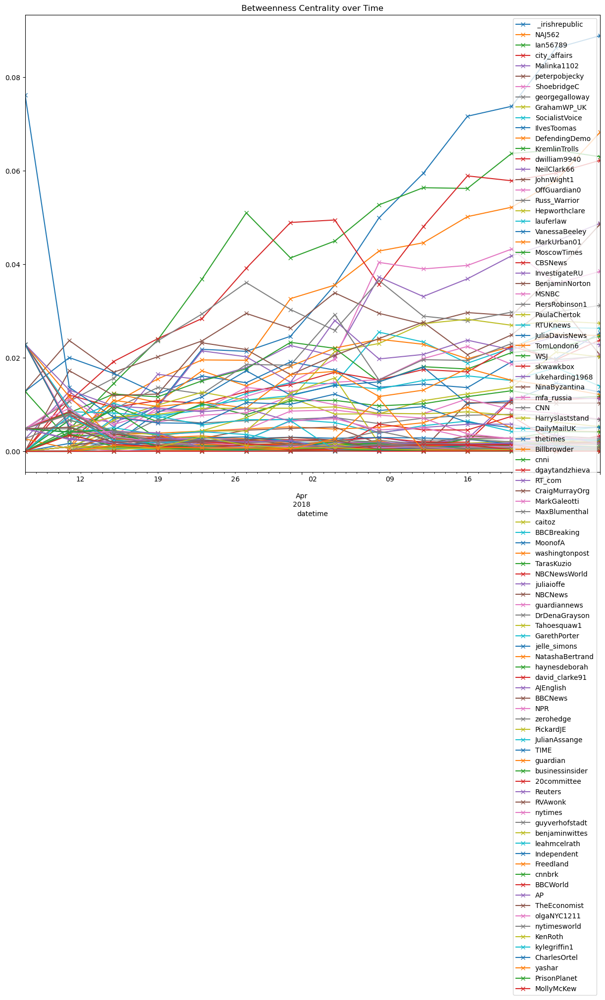

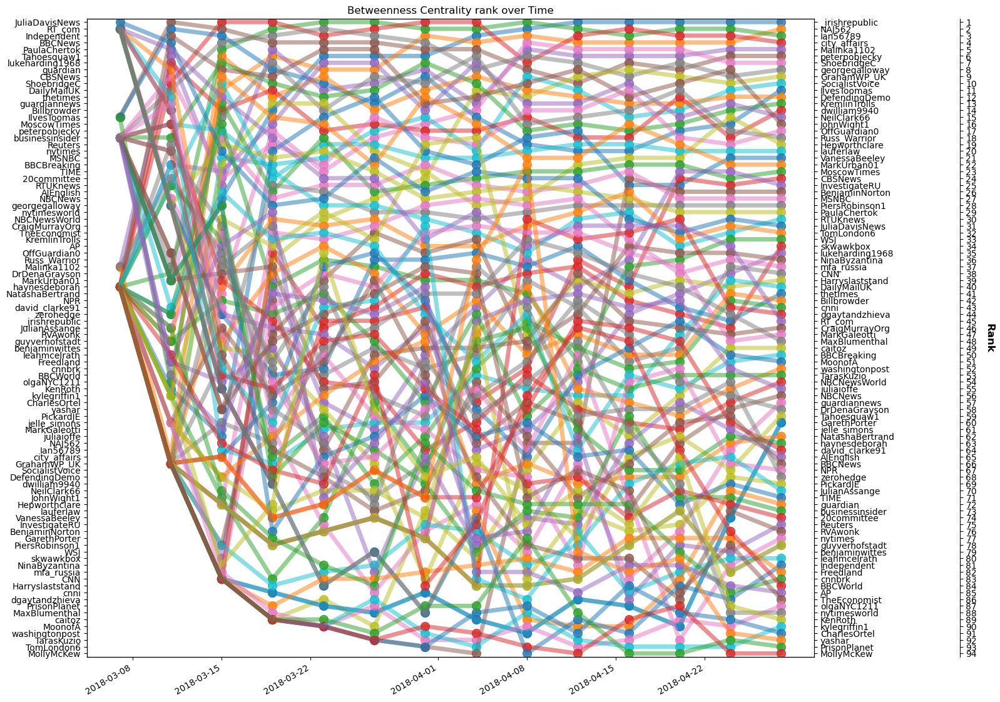

In [16]:
bc_threshold = 0.0

bc_ovtime_df.sort_values(by=bc_ovtime_df.iloc[-1].name, axis=1, ascending=False, inplace=True)
#bc_ovtime_df.loc[:, (bc_ovtime_df.iloc[]) & (bc_ovtime_df.iloc[-1] > bc_threshold)].
cols = list(bc_ovtime_df.loc[:, bc_ovtime_df.iloc[-1] > bc_threshold].columns) #+ ['CraigMurrayOrg']
bc_ovtime_df[cols].rename(columns={"_irishrepublic":" _irishrepublic"}).plot(marker='x', figsize=(15,12))
plt.title("Betweenness Centrality over Time")
plt.show()

df_bc_date = bc_ovtime_df[cols].rank(axis=1, method='min', ascending=False)
#df_date

plt.figure(figsize=(15, 15))

[laxis, raxis, fraxis] = bumpchart(
                           df_bc_date, show_rank_axis= True, 
                           rank_axis_distance= 1.2,
                           ax= None, 
                           scatter= True, 
                           holes= False,
                           line_args= {"linewidth": 5, "alpha": 0.5},
                           scatter_args= {"s": 100, "alpha": 0.8},
                           hole_args= {"s": 100, "alpha": 1})



laxis.set_axisbelow(True)

fraxis.set_ylabel("Rank", rotation= -90, labelpad= 20, fontsize= 12, weight= "semibold")

plt.gcf().autofmt_xdate()
plt.title("Betweenness Centrality rank over Time")
plt.show()

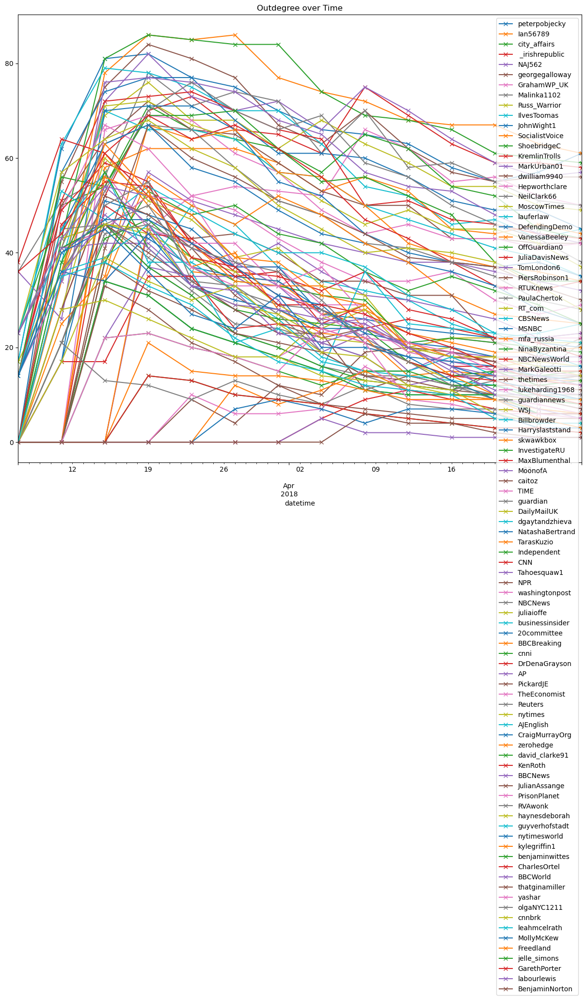

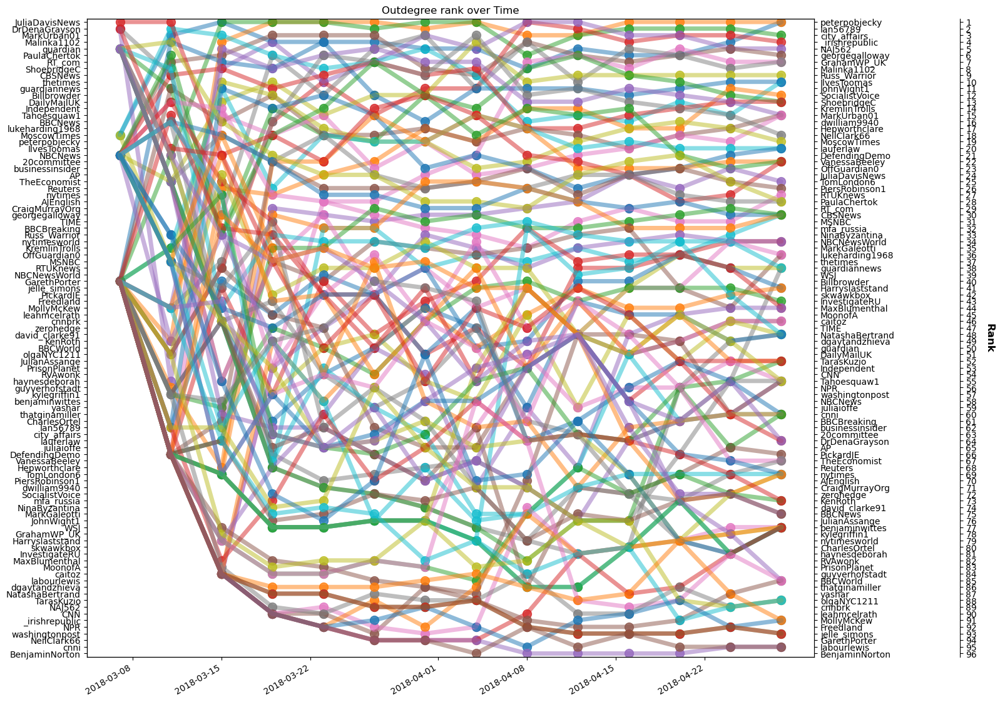

In [17]:
outdegree_threshold = 0

user_outdegree_ovtime_df.sort_values(by=user_outdegree_ovtime_df.iloc[-1].name, axis=1, ascending=False, inplace=True)
user_outdegree_ovtime_df.loc[:, user_outdegree_ovtime_df.iloc[-1] > outdegree_threshold].rename(columns={"_irishrepublic":" _irishrepublic"}).plot(marker='x', figsize=(15,12))
plt.title("Outdegree over Time")
plt.show()

df_date = user_outdegree_ovtime_df.loc[:, user_outdegree_ovtime_df.iloc[-1] > outdegree_threshold].rank(axis=1, method='min', ascending=False)
#df_date

plt.figure(figsize=(15, 15))

[laxis, raxis, fraxis] = bumpchart(
                           df_date, show_rank_axis= True, 
                           rank_axis_distance= 1.2,
                           ax= None, 
                           scatter= True, 
                           holes= False,
                           line_args= {"linewidth": 5, "alpha": 0.5},
                           scatter_args= {"s": 100, "alpha": 0.8},
                           hole_args= {"s": 100, "alpha": 1})



laxis.set_axisbelow(True)

fraxis.set_ylabel("Rank", rotation= -90, labelpad= 20, fontsize= 12, weight= "semibold")

plt.gcf().autofmt_xdate()
plt.title("Outdegree rank over Time")
plt.show()

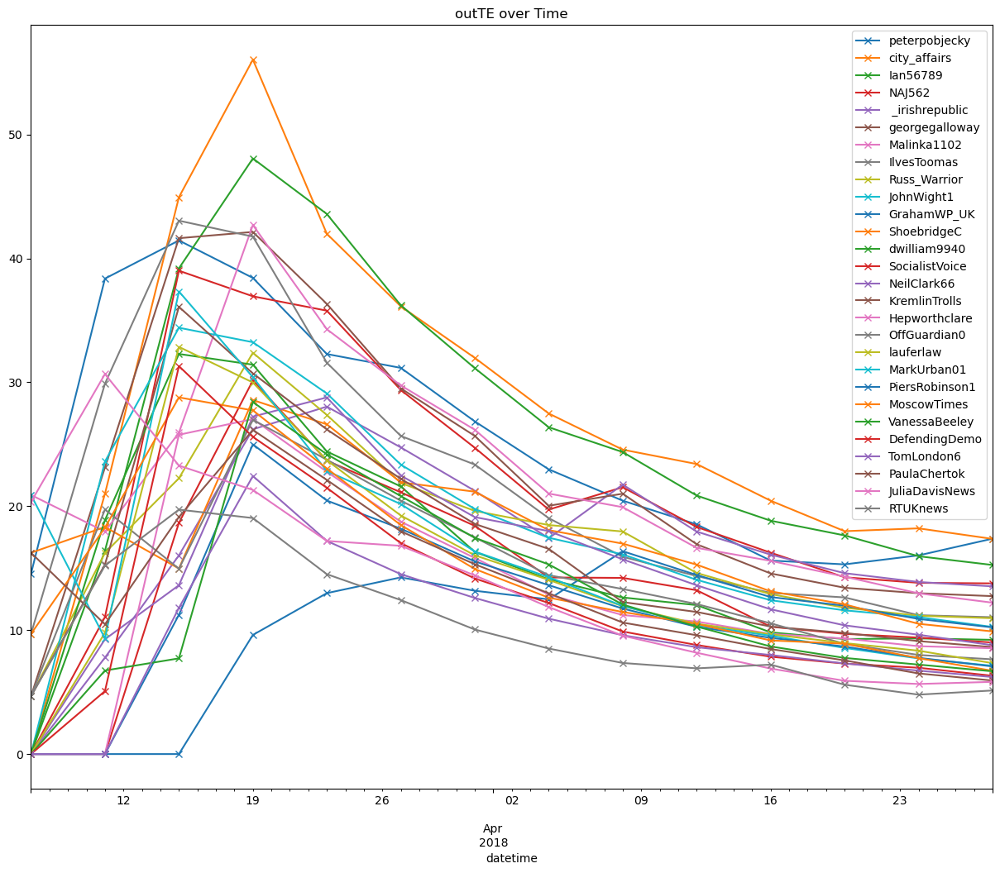

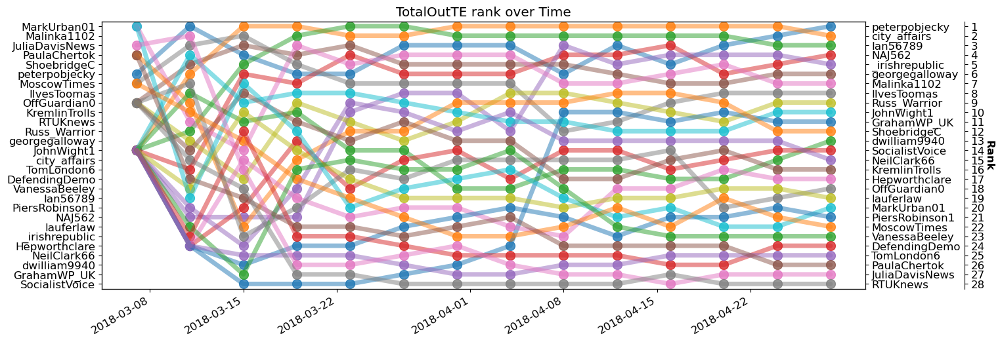

In [18]:



outTE_threshold = 5

user_outTE_ovtime_df.sort_values(by=user_outTE_ovtime_df.iloc[-1].name, axis=1, ascending=False, inplace=True)
user_outTE_ovtime_df.loc[:, user_outTE_ovtime_df.iloc[-1] > outTE_threshold].rename(columns={"_irishrepublic":" _irishrepublic"}).plot(marker='x', figsize=(15,12))
plt.title("outTE over Time")
plt.show()

df_date = user_outTE_ovtime_df.loc[:, user_outTE_ovtime_df.iloc[-1] > outTE_threshold].rank(axis=1, method='min', ascending=False)
#df_date

plt.rcParams.update({'font.size': 12})

plt.figure(figsize=(15, 6))

[laxis, raxis, fraxis] = bumpchart(
                           df_date, show_rank_axis= True, 
                           rank_axis_distance= 1.13,
                           ax= None, 
                           scatter= True, 
                           holes= False,
                           line_args= {"linewidth": 5, "alpha": 0.5},
                           scatter_args= {"s": 100, "alpha": 0.8},
                           hole_args= {"s": 100, "alpha": 1})



laxis.set_axisbelow(True)

fraxis.set_ylabel("Rank", rotation= -90, labelpad= 10, fontsize= 12, weight= "semibold")

plt.gcf().autofmt_xdate()
plt.title("TotalOutTE rank over Time")
plt.savefig("TotalOutTERank.png")
plt.show()

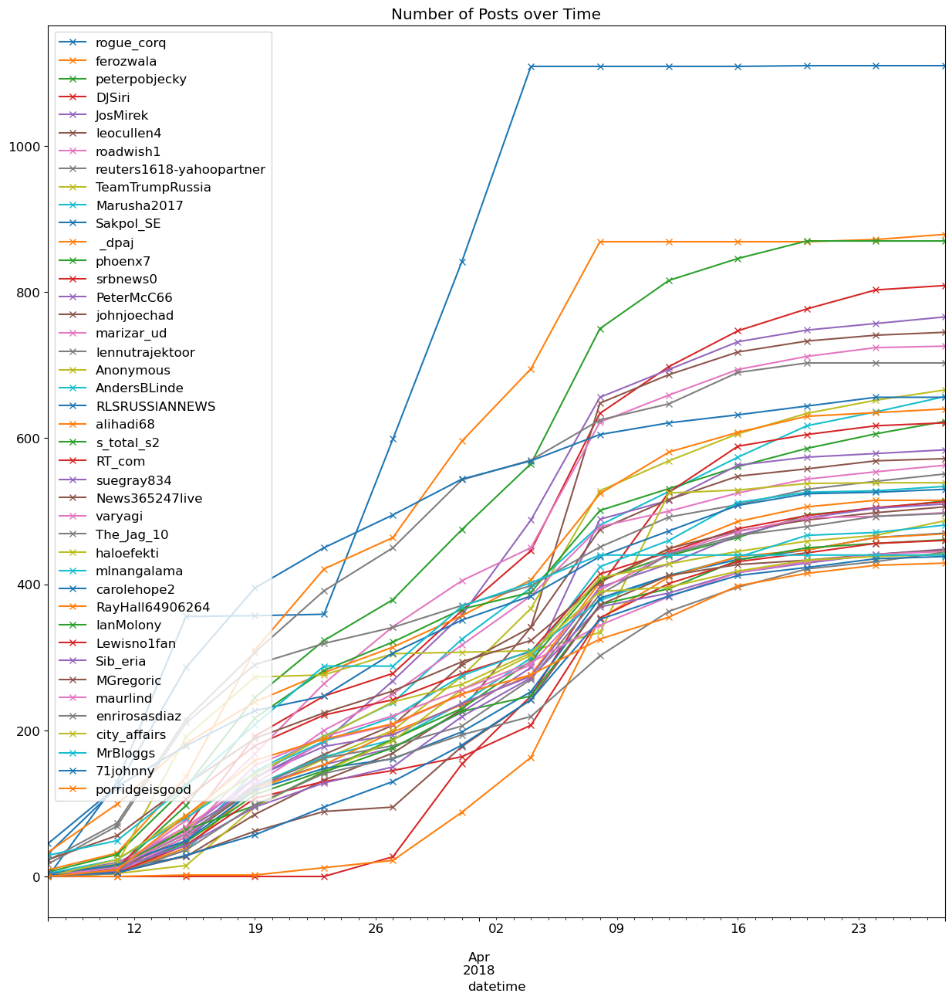

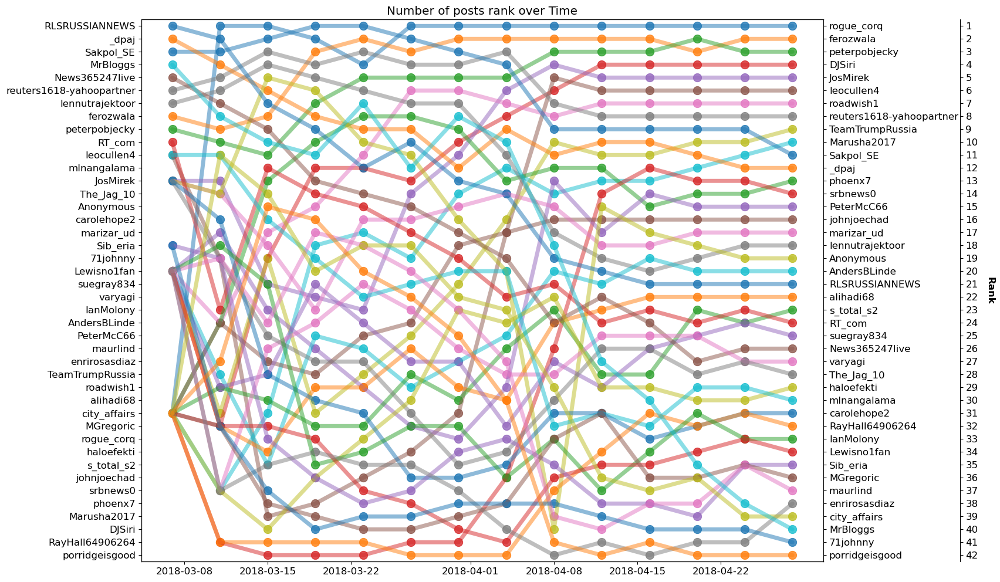

In [19]:
postcount_threshold = 425

user_postcount_ovtime_df.sort_values(by=user_postcount_ovtime_df.iloc[-1].name, axis=1, ascending=False, inplace=True)
user_postcount_ovtime_df.loc[:,(user_postcount_ovtime_df.iloc[-1] > postcount_threshold)].rename(columns={"_dpaj":" _dpaj"}).plot(marker='x', figsize=(15,15))
plt.title("Number of Posts over Time")
plt.show()

df_num = user_postcount_ovtime_df.loc[:,user_postcount_ovtime_df.iloc[-1] > postcount_threshold].rank(axis=1, method='min', ascending=False)
#df_num

plt.figure(figsize=(15, 12))
[laxis, raxis, fraxis] = bumpchart(df_num, show_rank_axis= True, rank_axis_distance= 1.2, scatter= True, holes= False,
          line_args= {"linewidth": 5, "alpha": 0.5}, scatter_args= {"s": 100, "alpha": 0.8})
laxis.set_axisbelow(True)
fraxis.set_ylabel("Rank", rotation= -90, labelpad= 20, fontsize= 12, weight= "semibold")
plt.title("Number of posts rank over Time")
plt.show()

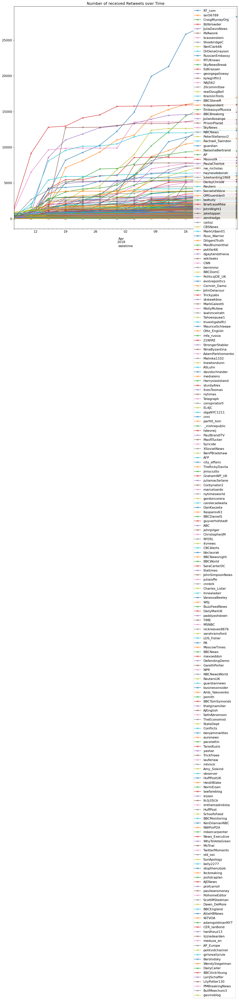

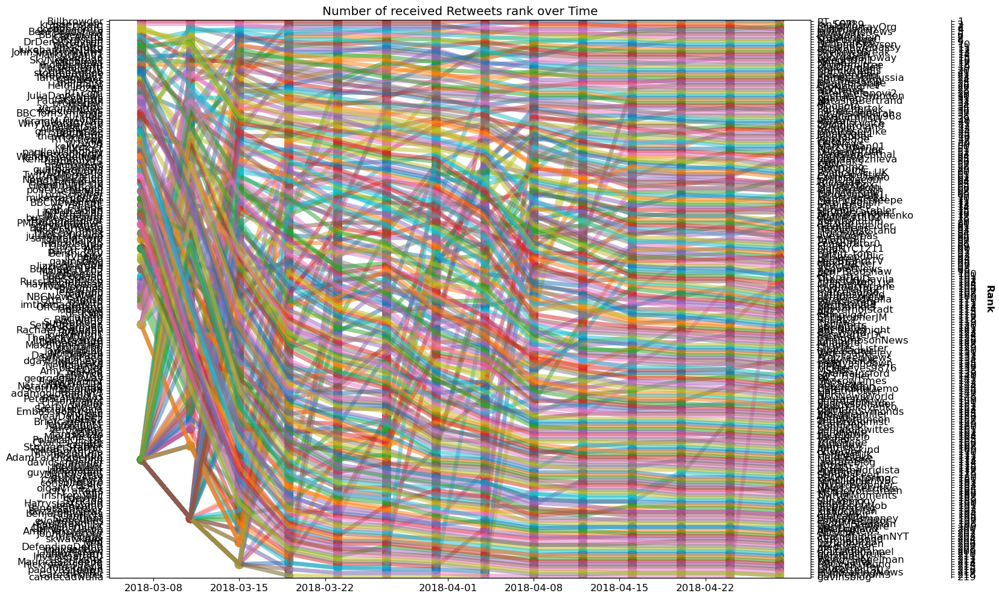

In [20]:
rr_threshold = 0

rr_ovtime_df.sort_values(by=rr_ovtime_df.iloc[-1].name, axis=1, ascending=False, inplace=True)
rr_ovtime_df.loc[:,rr_ovtime_df.iloc[-1] > rr_threshold].rename(columns={"_irishrepublic":" _irishrepublic"}).plot(marker='x', figsize=(15,15))
plt.title("Number of received Retweets over Time")
plt.show()

df_num2 = rr_ovtime_df.loc[:,rr_ovtime_df.iloc[-1] > rr_threshold].rank(axis=1, ascending=False)
#df_num2

plt.figure(figsize=(15, 12))
[laxis, raxis, fraxis] = bumpchart(df_num2, show_rank_axis= True, rank_axis_distance= 1.2, scatter= True, holes= False,
          line_args= {"linewidth": 5, "alpha": 0.5}, scatter_args= {"s": 100, "alpha": 0.8})
laxis.set_axisbelow(True)
fraxis.set_ylabel("Rank", rotation= -90, labelpad= 20, fontsize= 12, weight= "semibold")
plt.title("Number of received Retweets rank over Time")
plt.show()

In [21]:
t = all_osn_msgs_df
all_osn_msgs_df[all_osn_msgs_df['article_url'].apply(lambda x: "https://www.craigmurray.org.uk/" in x if type(x) is str else False)]

,Query Id,Query Name,datetime,title,Url,platform,Sentiment,Page Type,Language,Country Code,...,Reddit Comments,Reddit Score,Reddit Score Upvote Ratio,Region,Region Code,Root Blog Name,Root Post Id,Subreddit,Subreddit Subscribers,Weblog Title
125,2001100576,MainQuery,2018-03-06 23:50:28,RT @Katebuffery01 @Rachael_Swindon @buffybatik...,http://twitter.com/mellors4/statuses/971171183...,twitter.com,neutral,twitter,en,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mellors4 (mellors)
291,2001100576,MainQuery,2018-03-06 23:39:36,RT @Katebuffery01 @Rachael_Swindon @buffybatik...,http://twitter.com/mariuskwint/statuses/971168...,twitter.com,neutral,twitter,en,GBR,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mariuskwint (Marius Kwint)
349,2001100576,MainQuery,2018-03-06 23:34:33,RT @CraigMurrayOrg Skripal is no Litvinenko - ...,http://twitter.com/davelawson35/statuses/97116...,twitter.com,negative,twitter,en,GBR,...,NaN,NaN,NaN,Yorkshire and the Humber,GBR.Yorkshire and the Humber,NaN,NaN,NaN,NaN,davelawson35 (david andrew lawson)
547,2001100576,MainQuery,2018-03-06 23:16:19,RT @CraigMurrayOrg Skripal is no Litvinenko - ...,http://twitter.com/RoelandRuijsch/statuses/971...,twitter.com,negative,twitter,en,NLD,...,NaN,NaN,NaN,Noord-Brabant,NLD.Noord-Brabant,NaN,NaN,NaN,NaN,RoelandRuijsch (Roeland Ruijsch)
621,2001100576,MainQuery,2018-03-06 23:10:57,@Rachael_Swindon @buffybatik This is from an e...,http://twitter.com/Katebuffery01/statuses/9711...,twitter.com,neutral,twitter,en,GBR,...,NaN,NaN,NaN,Greater London,GBR.Greater London,NaN,NaN,NaN,NaN,Katebuffery01 (Winble)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017515,2001099695,MIPs test,2018-04-21 05:31:25,The #Novichok Story Is Indeed Another #Iraqi #...,http://twitter.com/ISRAEL_PREDATOR/statuses/98...,twitter.com,neutral,twitter,en,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ISRAEL_PREDATOR (ISRAEL BOMBS BABIES)
1017633,2001099695,MIPs test,2018-04-21 03:51:52,..\nYulia Skripal Is Plainly Under Duress: \n....,http://twitter.com/ABELL_1689/statuses/9875393...,twitter.com,neutral,twitter,en,SRB,...,NaN,NaN,NaN,Grad Beograd,SRB.Grad Beograd,NaN,NaN,NaN,NaN,ABELL_1689 (ABELL 1689)
1017858,2001099695,MIPs test,2018-04-21 01:53:29,RT @rosendo_joe Senior Civil Servants Still De...,http://twitter.com/McnairMira/statuses/9875095...,twitter.com,neutral,twitter,en,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,McnairMira (mira mcnair)
1017861,2001099695,MIPs test,2018-04-21 01:51:59,Senior Civil Servants Still Deeply Sceptical o...,http://twitter.com/rosendo_joe/statuses/987509...,twitter.com,negative,twitter,en,CAN,...,NaN,NaN,NaN,Ontario,CAN.ON,NaN,NaN,NaN,NaN,rosendo_joe (Joe Emersberger)


In [22]:
all_osn_msgs_df[all_osn_msgs_df['source_user_id'] == 'CraigMurrayOrg']

,Query Id,Query Name,datetime,title,Url,platform,Sentiment,Page Type,Language,Country Code,...,Reddit Comments,Reddit Score,Reddit Score Upvote Ratio,Region,Region Code,Root Blog Name,Root Post Id,Subreddit,Subreddit Subscribers,Weblog Title
17935,2001100576,MainQuery,2018-03-06 07:51:34,Skripal is no Litvinenko - There is a major di...,http://twitter.com/CraigMurrayOrg/statuses/970...,twitter.com,negative,twitter,en,GBR,...,NaN,NaN,NaN,Eastern Scotland,GBR.Eastern,NaN,NaN,NaN,NaN,CraigMurrayOrg (Craig Murray)
36917,2001099695,MIPs test,2018-03-07 19:05:05,The Elephant In The Room - Nerve agents includ...,http://twitter.com/CraigMurrayOrg/statuses/971...,twitter.com,neutral,twitter,en,GBR,...,NaN,NaN,NaN,Eastern Scotland,GBR.Eastern,NaN,NaN,NaN,NaN,CraigMurrayOrg (Craig Murray)
184887,2001100576,MainQuery_withoutFb,2018-03-13 13:06:27,@gillypierre1 Created to be unknown to the Wes...,http://twitter.com/CraigMurrayOrg/statuses/973...,twitter.com,neutral,twitter,en,GBR,...,NaN,NaN,NaN,Eastern Scotland,GBR.Eastern,NaN,NaN,NaN,NaN,CraigMurrayOrg (Craig Murray)
234932,2001100576,MainQuery_withoutFb,2018-03-14 16:12:24,The Novichok Story Is Indeed Another Iraqi WMD...,http://twitter.com/CraigMurrayOrg/statuses/973...,twitter.com,neutral,twitter,en,GBR,...,NaN,NaN,NaN,Eastern Scotland,GBR.Eastern,NaN,NaN,NaN,NaN,CraigMurrayOrg (Craig Murray)
306463,2001099695,MIPs test,2018-03-15 06:55:08,@deadlyvices @corbyn50plus 2/2 Therefore if th...,http://twitter.com/CraigMurrayOrg/statuses/974...,twitter.com,neutral,twitter,en,GBR,...,NaN,NaN,NaN,Eastern Scotland,GBR.Eastern,NaN,NaN,NaN,NaN,CraigMurrayOrg (Craig Murray)
313666,2001099695,MIPs test,2018-03-15 00:14:38,@peterjukes @benimmo Actually https://t.co/Ia1...,http://twitter.com/CraigMurrayOrg/statuses/974...,twitter.com,positive,twitter,en,GBR,...,NaN,NaN,NaN,Eastern Scotland,GBR.Eastern,NaN,NaN,NaN,NaN,CraigMurrayOrg (Craig Murray)
382483,2001100576,MainQuery_withoutFb,2018-03-18 16:19:26,Boris Johnson Issues Completely New Story on “...,http://twitter.com/CraigMurrayOrg/statuses/975...,twitter.com,neutral,twitter,en,GBR,...,NaN,NaN,NaN,Eastern Scotland,GBR.Eastern,NaN,NaN,NaN,NaN,CraigMurrayOrg (Craig Murray)
384143,2001100576,MainQuery_withoutFb,2018-03-18 14:58:56,Craig Murray Radio 5 Interview on Skripal Atta...,http://twitter.com/CraigMurrayOrg/statuses/975...,twitter.com,neutral,twitter,en,GBR,...,NaN,NaN,NaN,Eastern Scotland,GBR.Eastern,NaN,NaN,NaN,NaN,CraigMurrayOrg (Craig Murray)
401786,2001100576,MainQuery_withoutFb,2018-03-17 20:28:48,First Recorded Successful Novichok Synthesis w...,http://twitter.com/CraigMurrayOrg/statuses/975...,twitter.com,neutral,twitter,en,GBR,...,NaN,NaN,NaN,Eastern Scotland,GBR.Eastern,NaN,NaN,NaN,NaN,CraigMurrayOrg (Craig Murray)
440815,2001100576,MainQuery_withoutFb,2018-03-23 17:09:06,RT @CraigMurrayOrg Porton Down scientist's Hig...,http://twitter.com/CraigMurrayOrg/statuses/977...,twitter.com,neutral,twitter,en,GBR,...,NaN,NaN,NaN,Eastern Scotland,GBR.Eastern,NaN,NaN,NaN,NaN,CraigMurrayOrg (Craig Murray)


In [23]:
edges_df[edges_df['UF_TM'] > 0.1]

,Source,Target,UF_UF,UF_UM,UF_TF,UF_TM,UM_UF,UM_UM,UM_TF,UM_TM,TF_UF,TF_UM,TF_TF,TF_TM,TM_UF,TM_UM,TM_TF,TM_TM,total_te
375,3,43,0.000000,0.000000,0.000000,0.113246,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.113246
382,3,50,0.000000,0.000000,0.000000,0.102898,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.102898
389,3,57,0.000000,0.000000,0.000000,0.111538,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.111538
910,8,23,0.016172,0.010715,0.043727,0.107678,0.010411,0.005964,0.004742,0.000983,0.009601,0.002593,0.000913,0.017896,0.030092,0.099468,0.000132,0.022848,0.383935
978,8,91,0.000000,0.000000,0.035865,0.102656,0.000000,0.000000,0.002348,0.033788,0.000000,0.000000,0.034483,0.067445,0.000000,0.000000,0.021378,0.024163,0.322125
1338,12,6,0.032176,0.021794,0.033836,0.120368,0.018833,0.031739,0.015336,0.042803,0.000896,0.023398,0.000444,0.055504,0.024035,0.018991,0.022904,0.048495,0.511553
1357,12,26,0.000000,0.000000,0.000000,0.109163,0.000000,0.000000,0.000000,0.087040,0.000000,0.000000,0.000000,0.007555,0.000000,0.000000,0.000000,0.070057,0.273815
1363,12,32,0.027603,0.107165,0.000000,0.134510,0.004862,0.016701,0.000000,0.111022,0.050792,0.023394,0.000000,0.024301,0.011515,0.023172,0.000000,0.026001,0.561039
1369,12,38,0.062275,0.032330,0.032176,0.144701,0.048340,0.028751,0.019790,0.002642,0.089140,0.020594,0.000896,0.070965,0.040239,0.019760,0.024035,0.020609,0.657244
1376,12,45,0.000000,0.000000,0.000000,0.109581,0.000000,0.000000,0.000000,0.010864,0.000000,0.000000,0.000000,0.060643,0.000000,0.000000,0.000000,0.004114,0.185202


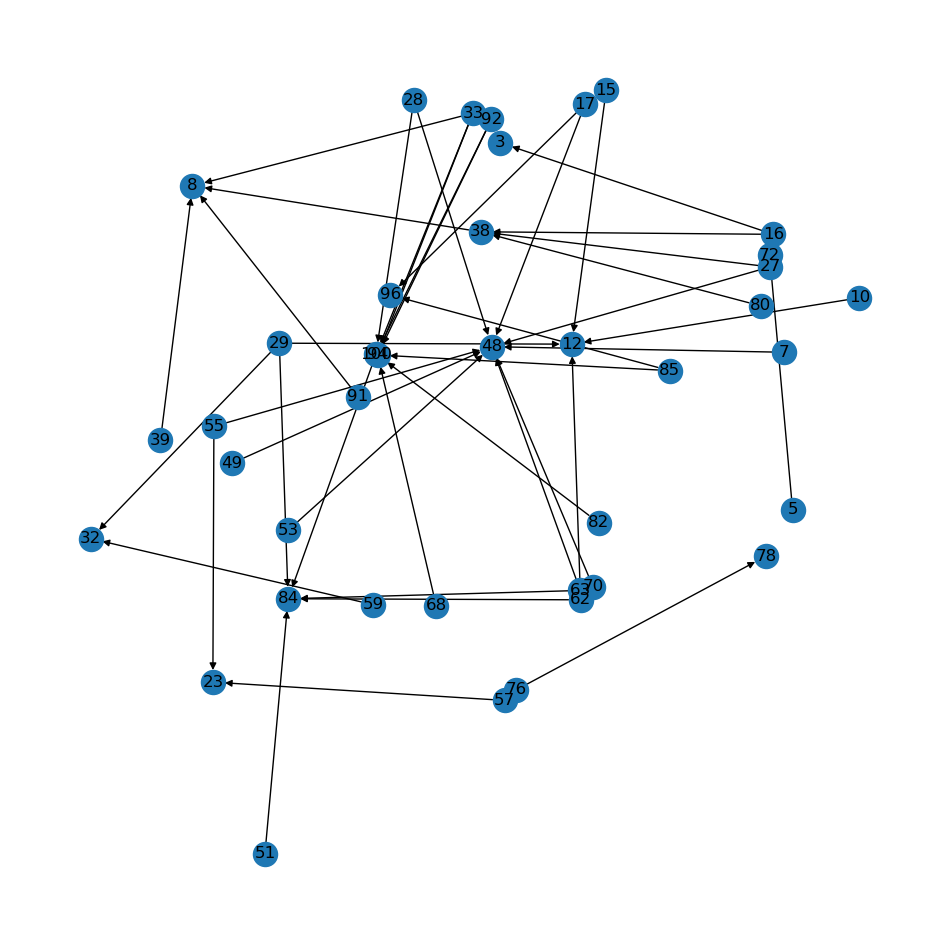

In [24]:
G = nx.from_pandas_edgelist(edges_df[edges_df['TM_UF'] > 0.1], "Source", "Target", ["total_te"], create_using=nx.DiGraph())

plt.figure(3,figsize=(12,12)) 
pos = nx.kamada_kawai_layout(G) # nx.spring_layout(G) 
#edge_color = nx.get_edge_attributes(G,'color').values()
#edge_labels = nx.draw_networkx_edge_labels(G, pos=pos)
labels = nx.draw_networkx_labels(G, pos=pos)
nx.draw(G, pos=pos)#, edge_color=edge_color)

In [25]:
#all_osn_msgs_df[all_osn_msgs_df['article_url'].apply(lambda x: "gainsvilletimes.com" in x if type(x) is str else False)]
#"nytimes" in all_osn_msgs_df['article_url'].iloc[1018203]
all_osn_msgs_df['news_domain']#[(all_osn_msgs_df['source_user_id'] == 'washingtonpost') & ("ria.ru" in all_osn_msgs_df['article_url'])]

KeyError: 'news_domain'

In [ ]:
all_osn_msgs_df.columns.tolist()